# Analyses of Baby Name Popularity Distribution in U.S. for the Last 144 Years

In [1]:
import numpy as np
import pandas as pd

# plotting
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt

# stats
from statsmodels.api import tsa # time series analysis
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from datetime import datetime
import plotly
import plotly.express as px


from warnings import filterwarnings
filterwarnings('ignore')


import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

### 1.1 Last 144 Years Baby Name Dataset

In [2]:
file_path = '/Users/yingzhou/Downloads/Capstone_Babyname/notebooks/Featured_Data.csv'

# Read the CSV file into a DataFrame
data = pd.read_csv(file_path, index_col=0)

# Display the first few rows to verify
print(data.head())

           Name  Year Gender  Count  Name_Ratio  Gender_Name_Ratio  Is_Famous  \
128731    Aaden  2008      M    958    0.243760           0.469689          0   
129570    Aaden  2009      M   1268    0.331981           0.639458          0   
114438  Aaliyah  1994      F   1451    0.390318           0.812591          0   
115498  Aaliyah  1995      F   1256    0.342980           0.714250          0   
116688  Aaliyah  1996      F    831    0.227856           0.474070          0   

        Gender_Binary  Year_of_Last_Appearance  Is_Top_100  ...  \
128731              1                     2009           0  ...   
129570              1                     2009           0  ...   
114438              0                     2023           0  ...   
115498              0                     2023           0  ...   
116688              0                     2023           0  ...   

        Rolling_Average_Gender_Ratio_5_Years  \
128731                              0.469689   
129570        

In [3]:
data.shape

(144042, 21)

In [4]:
data_num= data.select_dtypes('number')

In [5]:
data_num.shape

(144042, 19)

## Part 2 - Cluster Modelling

### Part 2.1 - Clustering Methods Comparasion

We can start clustering the data using three different methods and evaluate their overall performance. We will be using 

- K-Means 
- Gaussian Mixture Model
- Hierarchical Clustering (Agglomerative)

In [6]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler

In [7]:
# First we need to create a subset of the data
df_samp = data.sample(frac=0.25, random_state=45)

In [8]:
df_samp.shape

(36010, 21)

In [9]:
df_num= df_samp.select_dtypes('number')

In [10]:
from sklearn.model_selection import train_test_split

X = df_num.drop(columns=['Is_Top_100'])   
y = df_num['Is_Top_100']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [11]:
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define column groups
binary_features = ['Is_Famous', 'Gender_Binary']
continuous_features = [
    'Year', 'Count', 'Name_Ratio', 'Gender_Name_Ratio', 'Year_of_Last_Appearance',
    'Rolling_Average_Count_5_Years', 'Rolling_Average_Gender_Ratio_5_Years',
    'Rolling_Average_National_Ratio_5_Years', 'Yearly_Change_Count',
    'Yearly_Change_Gender_Ratio', 'Yearly_Change_National_Ratio', 'Name_Length',
    'Vowel_Count', 'Consonant_Count', 'Vowel_Ratio', 'Ends_With_Specified_Letters'
]

# Split the data first
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the preprocessor pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('binary', 'passthrough', binary_features),
        ('continuous', Pipeline([
            ('scaler', StandardScaler()), 
            ('transformer', PowerTransformer()) 
        ]), continuous_features)
    ]
)

# Fit the scaler only on the training data
pipeline = Pipeline([('preprocessor', preprocessor)])
pipeline.fit(X_train)

# Transform both training and test sets
X_train_transformed = pipeline.transform(X_train)
X_test_transformed = pipeline.transform(X_test)

# Get feature names after transformation
# For continuous features
continuous_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['scaler'].get_feature_names_out()
# For binary features, they remain the same
binary_feature_names = binary_features

# Combine feature names
feature_names = list(binary_feature_names) + list(continuous_feature_names)

# Create DataFrames for transformed data
df_train_scaled = pd.DataFrame(X_train_transformed, columns=feature_names, index=X_train.index)
df_test_scaled = pd.DataFrame(X_test_transformed, columns=feature_names, index=X_test.index)

# Create DataFrames for transformed data
df_train_scaled = pd.DataFrame(X_train_transformed, columns=feature_names, index=X_train.index)
df_test_scaled = pd.DataFrame(X_test_transformed, columns=feature_names, index=X_test.index)


In [12]:
# we will test different values for the number of clusters
ks= np.arange(2,10)# we test cluster sizes from 2 to9

In [13]:
df_train_scaled.shape

(28808, 18)

In [14]:
df_train_scaled.isna().sum()

Is_Famous                                 0
Gender_Binary                             0
Year                                      0
Count                                     0
Name_Ratio                                0
Gender_Name_Ratio                         0
Year_of_Last_Appearance                   0
Rolling_Average_Count_5_Years             0
Rolling_Average_Gender_Ratio_5_Years      0
Rolling_Average_National_Ratio_5_Years    0
Yearly_Change_Count                       0
Yearly_Change_Gender_Ratio                0
Yearly_Change_National_Ratio              0
Name_Length                               0
Vowel_Count                               0
Consonant_Count                           0
Vowel_Ratio                               0
Ends_With_Specified_Letters               0
dtype: int64

In [15]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score

silScoresK=[]
silScoresA=[]
silScoresG=[]

for k in ks:
    print(f'We are currently on k={k}')
    # kmeans
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(df_train_scaled)
    silScoresK.append(silhouette_score(df_train_scaled, kmeans.labels_))
    
  
    # agglomerative clustering
    agglom=AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglom.fit(df_train_scaled)
    silScoresA.append(silhouette_score(df_train_scaled, agglom.labels_))
    

    # gaussian
    gmm=GaussianMixture(n_components=k)
    gmm.fit(df_train_scaled)
    silScoresG.append(silhouette_score(df_train_scaled, gmm.predict(df_train_scaled)))

We are currently on k=2
We are currently on k=3
We are currently on k=4
We are currently on k=5
We are currently on k=6
We are currently on k=7
We are currently on k=8
We are currently on k=9


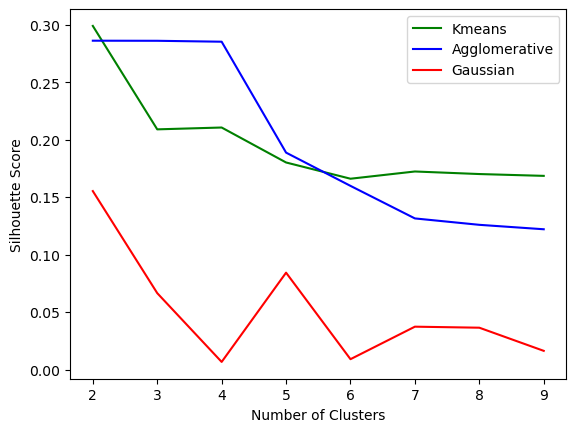

In [16]:
plt.figure()
plt.plot(ks,silScoresK, label="Kmeans", color='green')
plt.plot(ks,silScoresA, label="Agglomerative", color='blue')
plt.plot(ks,silScoresG, label="Gaussian", color='red')
plt.legend()
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [17]:
# Initialize KMeans
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit KMeans to the scaled training data
kmeans.fit(df_train_scaled)

# Predict cluster labels
kmeans_labels = kmeans.predict(df_train_scaled)

# Add cluster labels to the DataFrame
df_train_scaled['kmeans_label'] = kmeans_labels

# Print the DataFrame with cluster labels
print(df_train_scaled.head(1))


       Is_Famous  Gender_Binary      Year     Count  Name_Ratio  \
92002        1.0            0.0  0.475366 -0.748802   -1.030369   

       Gender_Name_Ratio  Year_of_Last_Appearance  \
92002          -1.018674                 1.031283   

       Rolling_Average_Count_5_Years  Rolling_Average_Gender_Ratio_5_Years  \
92002                       -0.82898                             -1.127332   

       Rolling_Average_National_Ratio_5_Years  Yearly_Change_Count  \
92002                               -1.135835            -0.009203   

       Yearly_Change_Gender_Ratio  Yearly_Change_National_Ratio  Name_Length  \
92002                   -0.000305                      0.000151     0.192482   

       Vowel_Count  Consonant_Count  Vowel_Ratio  Ends_With_Specified_Letters  \
92002     0.734069        -0.319545     0.700503                    -0.909773   

       kmeans_label  
92002             0  


In [18]:
df_train_scaled.shape

(28808, 19)

In [19]:
from sklearn.decomposition import PCA

# Fit PCA to the correctly preprocessed data
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_train_transformed)

# Check PCA components
print(f'Shape of PCA components: {pca.components_.shape}')

# Create the DataFrame with PCA loadings
loadings = pca.components_
loadings_df = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(loadings.shape[0])], index=feature_names)

# Display the loadings DataFrame
print(loadings_df.head())


Shape of PCA components: (3, 18)
                    PC1       PC2       PC3
Is_Famous      0.048691 -0.011281  0.010734
Gender_Binary  0.015931 -0.003437  0.143367
Year           0.131017 -0.052692  0.064362
Count          0.389676  0.004245 -0.016869
Name_Ratio     0.396289  0.021974 -0.076240


In [20]:
# Count the number of samples in each cluster
cluster_counts = df_train_scaled['kmeans_label'].value_counts()
print(cluster_counts)

0    19334
1     9474
Name: kmeans_label, dtype: int64


In [21]:


# Assuming df_train_scaled contains only the scaled features and no PCA components
# Perform PCA on df_train_scaled
myPCA = PCA(n_components=3)
pca_results = myPCA.fit_transform(df_train_scaled.drop(columns=['kmeans_label']))

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(pca_results, columns=[f'PC{i+1}' for i in range(pca_results.shape[1])], index=df_train_scaled.index)

# Add kmeans labels to the PCA DataFrame
pca_df['kmeans_label'] = df_train_scaled['kmeans_label']

# Print the DataFrame to confirm PCA components and labels are present
print(pca_df.head())


            PC1       PC2       PC3  kmeans_label
92002 -2.064609  0.109377 -0.088666             0
58412 -0.213731 -0.090212  1.292385             0
33317 -0.173627  0.237437 -0.652595             0
62961 -2.618781  0.131951  1.402253             0
10876 -3.197458  0.295398  0.734766             0


Index(['PC1', 'PC2', 'PC3', 'kmeans_label'], dtype='object')


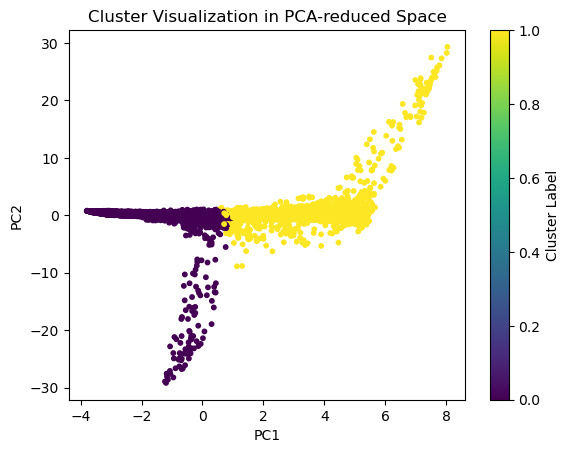

In [22]:


# Check the column names in pca_df
print(pca_df.columns)

# Plot clusters using the first two PCA components
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['kmeans_label'], cmap='viridis', s=10)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Cluster Visualization in PCA-reduced Space')
plt.colorbar(label='Cluster Label')
plt.show()

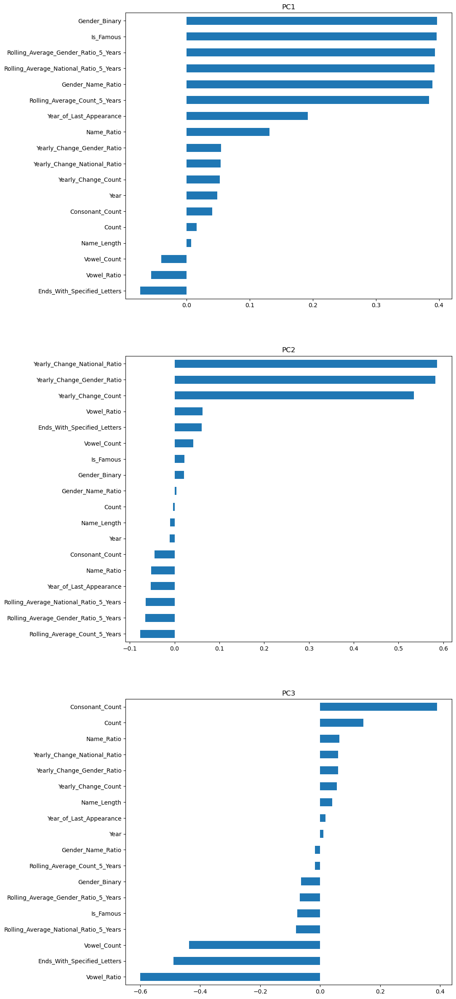

In [23]:
# Plot PCA component loadings
loadingsDF = pd.DataFrame(myPCA.components_.T, columns=['PC1', 'PC2', 'PC3'], index=X.columns)

plt.subplots(3, 1, figsize=(10, 30))

plt.subplot(3, 1, 1)
loadingsDF['PC1'].sort_values(ascending=True).plot(kind='barh')
plt.title('PC1')

plt.subplot(3, 1, 2)
loadingsDF['PC2'].sort_values(ascending=True).plot(kind='barh')
plt.title('PC2')

plt.subplot(3, 1, 3)
loadingsDF['PC3'].sort_values(ascending=True).plot(kind='barh')
plt.title('PC3')

plt.subplots_adjust(wspace=0.8)
plt.show()


In [24]:
np,sum(myPCA.explained_variance_ratio_)

(<module 'numpy' from '/Users/yingzhou/anaconda3/envs/ml_env/lib/python3.8/site-packages/numpy/__init__.py'>,
 0.6645086124207874)

In [25]:
# Create a DataFrame with PCA results and cluster labels
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2', 'PC3'])
pca_df['kmeans_label'] = kmeans_labels

In [26]:
pca_df.shape

(28808, 4)

In [27]:
# Print the column names and check for any discrepancies
print("Feature names used in preprocessing:", feature_names)


Feature names used in preprocessing: ['Is_Famous', 'Gender_Binary', 'Year', 'Count', 'Name_Ratio', 'Gender_Name_Ratio', 'Year_of_Last_Appearance', 'Rolling_Average_Count_5_Years', 'Rolling_Average_Gender_Ratio_5_Years', 'Rolling_Average_National_Ratio_5_Years', 'Yearly_Change_Count', 'Yearly_Change_Gender_Ratio', 'Yearly_Change_National_Ratio', 'Name_Length', 'Vowel_Count', 'Consonant_Count', 'Vowel_Ratio', 'Ends_With_Specified_Letters']


In [28]:
# let's visualize these clusters!
fig=px.scatter_3d(pca_df, x='PC1', y='PC2',z='PC3',color='kmeans_label', opacity=0.5)
fig.show()

In [29]:

# Drop columns that should not be included in the mean calculation
features_df = df_train_scaled.drop(columns=['kmeans_label'])

# Group by KMeans labels and compute the mean for each feature
featureMeans = features_df.groupby(df_train_scaled['kmeans_label']).mean().T

# Display the resulting DataFrame
print(featureMeans)


kmeans_label                                   0         1
Is_Famous                               0.737199  0.939519
Gender_Binary                           0.436744  0.472662
Year                                   -0.108888  0.222212
Count                                  -0.560444  1.143723
Name_Ratio                             -0.606134  1.236964
Gender_Name_Ratio                      -0.605345  1.235353
Year_of_Last_Appearance                -0.212615  0.433892
Rolling_Average_Count_5_Years          -0.547303  1.116904
Rolling_Average_Gender_Ratio_5_Years   -0.596195  1.216681
Rolling_Average_National_Ratio_5_Years -0.597059  1.218443
Yearly_Change_Count                    -0.058431  0.119242
Yearly_Change_Gender_Ratio             -0.063977  0.130560
Yearly_Change_National_Ratio           -0.062924  0.128412
Name_Length                            -0.001463  0.002985
Vowel_Count                             0.040418 -0.082483
Consonant_Count                        -0.033379  0.0681

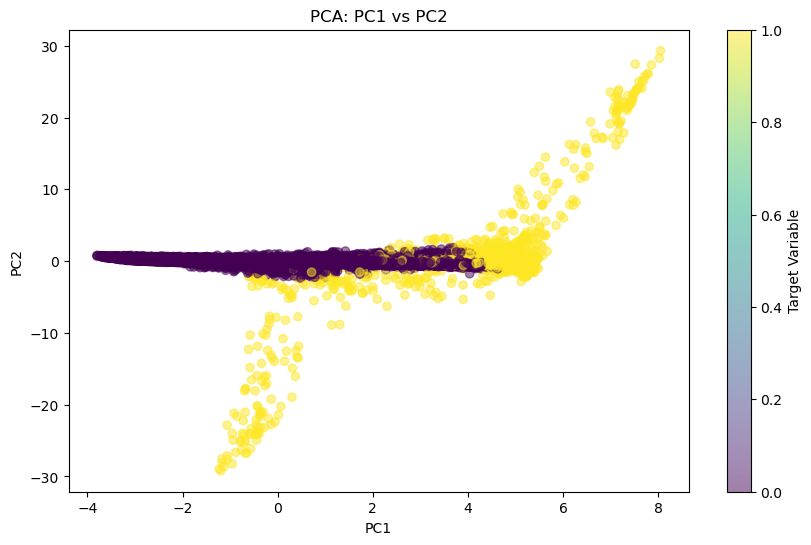

In [30]:
# Create a scatter plot of the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_train, cmap='viridis', alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA: PC1 vs PC2')
plt.colorbar(label='Target Variable')
plt.show()

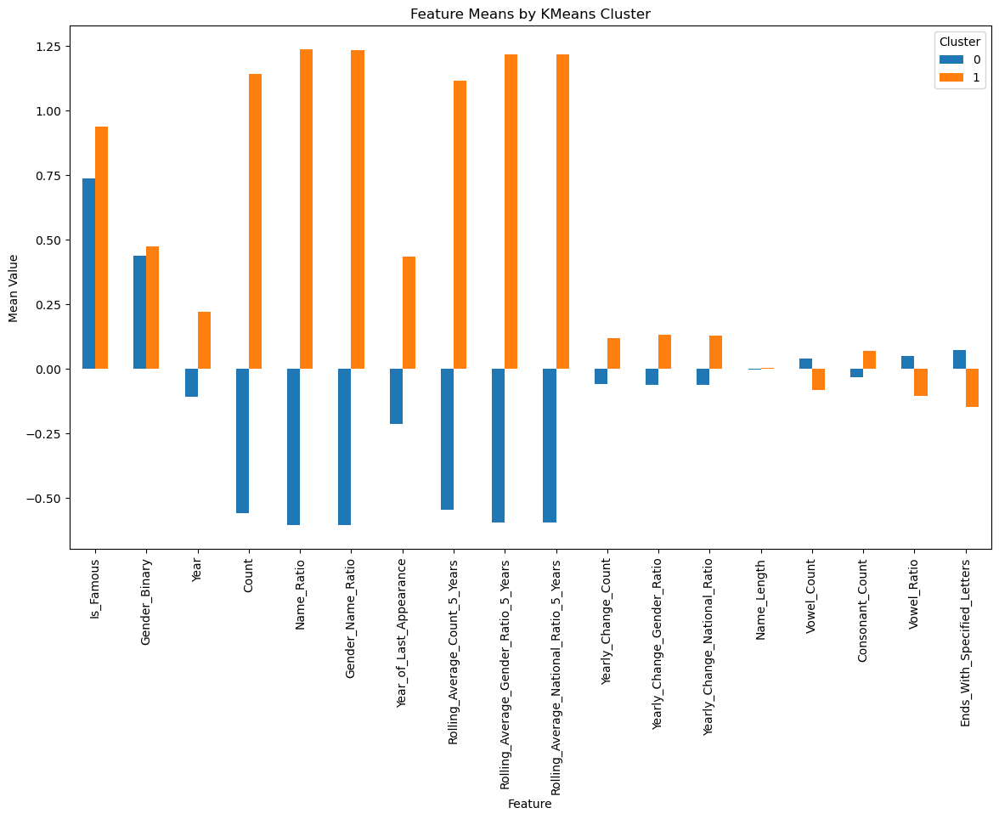

In [31]:
# Plotting the feature means for each cluster
featureMeans.plot(kind='bar', figsize=(14, 8))
plt.title('Feature Means by KMeans Cluster')
plt.ylabel('Mean Value')
plt.xlabel('Feature')
plt.xticks(rotation=90)
plt.legend(title='Cluster')
plt.show()

In [32]:
df_samp.isna().sum()

Name                                      0
Year                                      0
Gender                                    0
Count                                     0
Name_Ratio                                0
Gender_Name_Ratio                         0
Is_Famous                                 0
Gender_Binary                             0
Year_of_Last_Appearance                   0
Is_Top_100                                0
Rolling_Average_Count_5_Years             0
Rolling_Average_Gender_Ratio_5_Years      0
Rolling_Average_National_Ratio_5_Years    0
Yearly_Change_Count                       0
Yearly_Change_Gender_Ratio                0
Yearly_Change_National_Ratio              0
Name_Length                               0
Vowel_Count                               0
Consonant_Count                           0
Vowel_Ratio                               0
Ends_With_Specified_Letters               0
dtype: int64

In [33]:
# Group by cluster and compute mean for each feature
cluster_means = df_train_scaled.groupby('kmeans_label').mean()
print(cluster_means)


              Is_Famous  Gender_Binary      Year     Count  Name_Ratio  \
kmeans_label                                                             
0              0.737199       0.436744 -0.108888 -0.560444   -0.606134   
1              0.939519       0.472662  0.222212  1.143723    1.236964   

              Gender_Name_Ratio  Year_of_Last_Appearance  \
kmeans_label                                               
0                     -0.605345                -0.212615   
1                      1.235353                 0.433892   

              Rolling_Average_Count_5_Years  \
kmeans_label                                  
0                                 -0.547303   
1                                  1.116904   

              Rolling_Average_Gender_Ratio_5_Years  \
kmeans_label                                         
0                                        -0.596195   
1                                         1.216681   

              Rolling_Average_National_Ratio_5_Years  Ye

In [34]:
from sklearn.metrics import silhouette_score

# Drop the 'kmeans_label' column for evaluation
features = df_train_scaled.drop(columns=['kmeans_label'])

# Compute silhouette score
silhouette_avg = silhouette_score(features, df_train_scaled['kmeans_label'])
print(f'Silhouette Score: {silhouette_avg:.4f}')


Silhouette Score: 0.2992


In [35]:
# Filter data for smaller cluster
smaller_cluster = df_train_scaled[df_train_scaled['kmeans_label'] == 1]
print(smaller_cluster.describe())


         Is_Famous  Gender_Binary         Year        Count   Name_Ratio  \
count  9474.000000    9474.000000  9474.000000  9474.000000  9474.000000   
mean      0.939519       0.472662     0.222212     1.143723     1.236964   
std       0.238389       0.499278     0.969869     0.750704     0.611998   
min       0.000000       0.000000    -1.715206    -1.044172    -0.843052   
25%       1.000000       0.000000    -0.559483     0.736838     0.736981   
50%       1.000000       0.000000     0.282881     1.258745     1.307881   
75%       1.000000       1.000000     1.100837     1.753302     1.792230   
max       1.000000       1.000000     1.726183     2.121544     2.094162   

       Gender_Name_Ratio  Year_of_Last_Appearance  \
count        9474.000000              9474.000000   
mean            1.235353                 0.433892   
std             0.611186                 0.778650   
min            -0.820003                -1.742600   
25%             0.741058                -0.210885 

In [36]:
# Assuming df_train_scaled and df_samp have the same indices
df_samp['kmeans_label'] = df_train_scaled['kmeans_label']


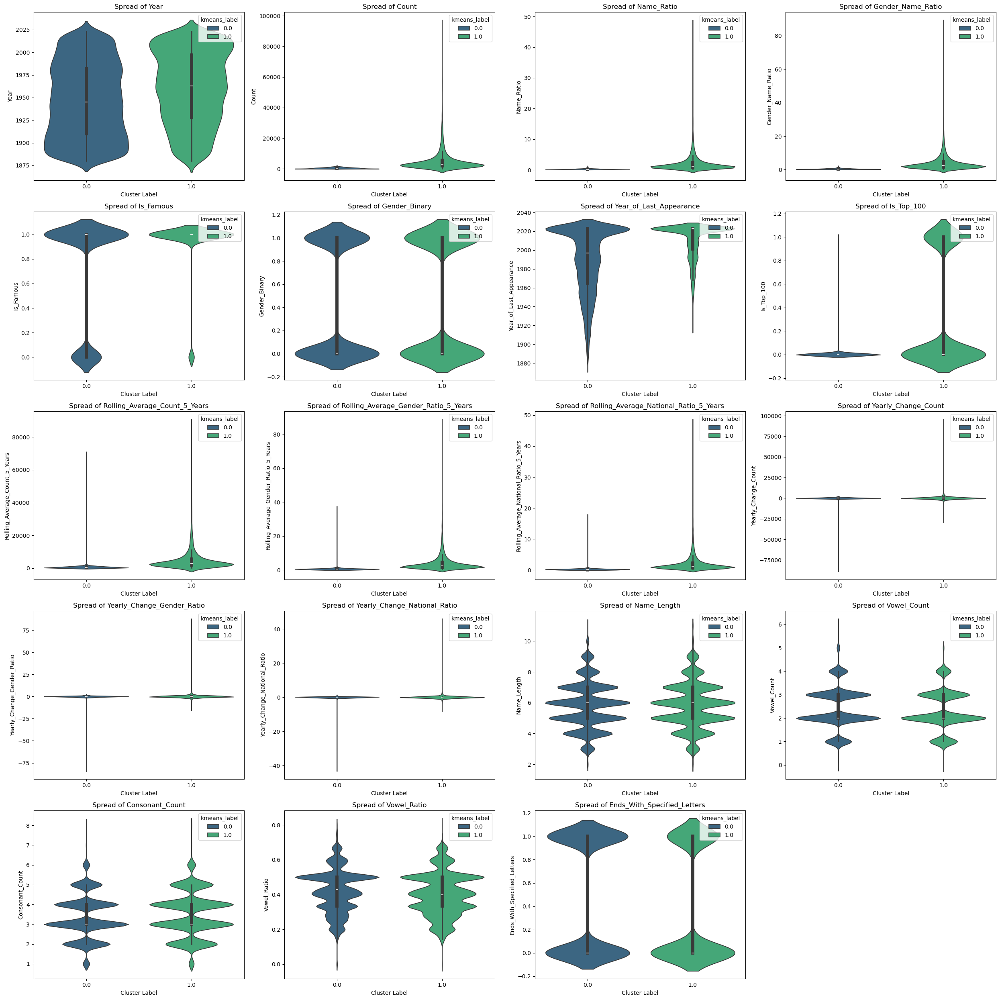

In [37]:
# Ensure the number of subplots matches the number of features
num_features = len(df_samp.drop(columns=['Name', 'Gender', 'kmeans_label']).columns)
num_rows = (num_features // 4) + (num_features % 4 > 0)

# Create subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(25, 5*num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Loop through features and plot
for i, col in enumerate(df_samp.drop(columns=['Name', 'Gender', 'kmeans_label']).columns):
    sns.violinplot(y=df_samp[col], x=df_samp['kmeans_label'], ax=axes[i], hue=df_samp['kmeans_label'], palette='viridis')
    axes[i].set_xlabel('Cluster Label')
    axes[i].set_ylabel(col)
    axes[i].set_title(f'Spread of {col}')

# Hide unused subplots if any
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()